This is done by Nguyễn Thế Thiện, 21127170, for Image & Video Processing course.

These exercises are run on Google Colab's T4 GPU.

Labs:
- Lab 01: Define a CNN by Pytorch, train a CNN, evaluate on datasets such as CIFAR-10, MNIST, Fashon MNIST

- Lab 02: Train/Use Yolo v8 to detect objects

- Lab 03: Finetuning Stable Diffusion using LoRA on the Dreambooth dataset https://github.com/google/dreambooth

In [2]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
RUN_FLAG = False # switch to True to run the entire thing

cuda


# Lab 1

In [ ]:
assert RUN_FLAG, "Lock triggered" # This is just to avoid running on accident

AssertionError: Lock triggered

## CNN definition

We load the datasets: CIFAR-10, MNIST, FashionMNIST from PyTorch as they have already been there. They all are datasets based on object classification with 10 classes.

For this exercise alone and also the upcoming project development, DarkNet53 is used. The architecture is a 53-layer CNN with output of 1024 filters, followed by global average pooling and a linear FC layer. The output shape should be $(N, 10)$.

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as f
from sklearn.metrics import precision_recall_fscore_support
import numpy as np

class residual_block(nn.Module):
  def __init__(self, in_channels):
    super().__init__()
    self.conv1 = nn.Conv2d(in_channels, in_channels // 2, kernel_size=1)
    self.bn1 = nn.BatchNorm2d(in_channels // 2)
    self.conv2 = nn.Conv2d(in_channels // 2, in_channels, kernel_size=3, padding = 1)
    self.bn2 = nn.BatchNorm2d(in_channels)

  def forward(self, input):
    x = f.relu(self.bn1(self.conv1(input)))
    x = self.bn2(self.conv2(x))
    x += input
    x = f.relu(x)
    return x

class conv_layer(nn.Module):
  def __init__(self, in_channels, out_channels, size, stride, pad, dil):
    super(conv_layer, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=size, stride = stride, padding = pad, dilation = dil)
    self.bn = nn.BatchNorm2d(out_channels)
    self.relu = nn.ReLU()

  def forward(self, input):
    output = self.relu(self.bn(self.conv1(input)))
    return output

class Darknet53(nn.Module):
  def __init__(self, in_channels):
    super().__init__()
    self.in_channels = in_channels

    self.model = nn.Sequential(
      conv_layer(in_channels, 32, 3, 1, 1, 1),
      conv_layer(32, 64, 3, 2, 1, 1),
      residual_block(64),
      conv_layer(64, 128, 3, 2, 1, 1),
      residual_block(128),
      residual_block(128),
      conv_layer(128, 256, 3, 2, 1, 1),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      residual_block(256),
      conv_layer(256, 512, 3, 2, 1, 1),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      residual_block(512),
      conv_layer(512, 1024, 3, 2, 1, 1),
      residual_block(1024),
      residual_block(1024),
      residual_block(1024),
      residual_block(1024),
      nn.AdaptiveAvgPool2d((1, 1)),
      nn.Flatten(),
      nn.Linear(1024, 10)
    )

  def reset(self):
    for layer in self.children():
      if hasattr(layer, 'reset_parameters'):
        layer.reset_parameters()

  def test(self, dataloader):
    # setups
    total_samples = 0
    top1correct = 0
    top3correct = 0
    total_loss = 0
    criterion = nn.CrossEntropyLoss()
    all_preds = [] # storing for f1
    all_labels = []

    # run
    self.model.eval()
    with torch.no_grad():
      for inputs, labels in dataloader:
        # main execute
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = self.model(inputs)
        total_samples += labels.size(0)

        _, predicted_classes = torch.max(outputs, 1)
        all_preds.extend(predicted_classes.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # top k
        _, predicted1 = outputs.topk(1, dim=1)
        _, predicted3 = outputs.topk(3, dim=1)
        top1correct += (predicted1 == labels.view(-1, 1)).sum().item()
        top3correct += (predicted3 == labels.view(-1, 1)).any(dim=1).sum().item()

        # loss
        loss = criterion(outputs, labels)
        total_loss += loss.item()

    # calculate
    top1_acc = 100 * top1correct / total_samples
    top3_acc = 100 * top3correct / total_samples
    total_loss /= len(dataloader)
    precision, recall, f1, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='macro', zero_division=0)

    # print
    print(f'Loss: {total_loss}')
    print(f'Top 1 accuracy: {top1_acc:.2f}%')
    print(f'Top 3 accuracy: {top3_acc:.2f}%')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1 Score: {f1:.2f}')

  def train(self, train_dataloader, eval_dataloader, best_model_file_name):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-3, betas=(0.9, 0.999))
    max_epochs = 50
    patience_ctr, patience = 0,5

    train_loss_history = []
    val_loss_history = []
    best_val_loss = float('inf')

    self.model.to(device)
    for epoch in range(max_epochs):
      stop_flag = False
      train_loss, val_loss = 0, 0

      self.model.train()
      for inputs, labels in train_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = self.model(inputs)
        loss = criterion(outputs, labels)
        train_loss += loss.item()
        loss.backward()
        optimizer.step()

      self.model.eval()
      with torch.no_grad():
        for inputs, labels in eval_dataloader:
          inputs = inputs.to(device)
          labels = labels.to(device)

          outputs = self.model(inputs)
          val_loss += criterion(outputs, labels).item()

      train_loss /= len(train_dataloader)
      val_loss /= len(eval_dataloader)

      # best epoch
      if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(self.model.state_dict(), best_model_file_name)
        patience_ctr = 0
      else:
        # early stopping
        patience_ctr += 1
        if patience_ctr > patience:
          stop_flag = True

      train_loss_history.append(train_loss)
      val_loss_history.append(val_loss)
      print(f'Epoch {epoch+1}/{max_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {eval_loss:.4f}')
      if stop_flag:
        print("Early stopping triggered.")
        break
    return train_loss_history, val_loss_history

## Datasets & train

### CIFAR-10

In [ ]:
import torchvision.transforms
from torch.utils.data import DataLoader

transformed_cifar10 = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.4915, 0.4823, 0.4468),
                         (0.2470, 0.2435, 0.2616))
])

train_cifar10 = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transformed_cifar10)
test_cifar10 = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transformed_cifar10)
eval_cifar10, test_cifar10 = torch.utils.data.random_split(test_cifar10, [len(test_cifar10) // 2, len(test_cifar10) - len(test_cifar10) // 2])

# limit_size = 2
# train_cifar10, _ = torch.utils.data.random_split(train_cifar10, [limit_size, len(train_cifar10) - limit_size])
# eval_cifar10, _ = torch.utils.data.random_split(eval_cifar10, [limit_size, len(eval_cifar10) - limit_size])
# test_cifar10, _ = torch.utils.data.random_split(test_cifar10, [limit_size, len(test_cifar10) - limit_size])

train_loader_cifar10 = DataLoader(train_cifar10, batch_size=100, shuffle=True)
eval_loader_cifar10 = DataLoader(eval_cifar10, batch_size=100, shuffle=False)
test_loader_cifar10 = DataLoader(test_cifar10, batch_size=100, shuffle=False)

darknet53_cifar10 = Darknet53(3).to(device)
cifar_train_loss_history, cifar_val_loss_history = darknet53_cifar10.train(train_loader_cifar10, eval_loader_cifar10, 'darknet53_cifar10.pth')

100%|██████████| 170M/170M [00:06<00:00, 27.7MB/s]


Epoch 1/50, Train Loss: 1.8883, Val Loss: 2.1553
Epoch 2/50, Train Loss: 1.4155, Val Loss: 1.4199
Epoch 3/50, Train Loss: 1.4225, Val Loss: 1.3476
Epoch 4/50, Train Loss: 1.1230, Val Loss: 1.2640
Epoch 5/50, Train Loss: 1.0560, Val Loss: 9.9285
Epoch 6/50, Train Loss: 0.9315, Val Loss: 0.9025
Epoch 7/50, Train Loss: 0.9111, Val Loss: 0.9810
Epoch 8/50, Train Loss: 0.8460, Val Loss: 1.3822
Epoch 9/50, Train Loss: 0.8044, Val Loss: 0.9204
Epoch 10/50, Train Loss: 0.6743, Val Loss: 0.8668
Epoch 11/50, Train Loss: 0.5852, Val Loss: 1.1522
Epoch 12/50, Train Loss: 0.5206, Val Loss: 0.7312
Epoch 13/50, Train Loss: 0.3910, Val Loss: 0.8132
Epoch 14/50, Train Loss: 0.3562, Val Loss: 0.9532
Epoch 15/50, Train Loss: 0.2669, Val Loss: 0.9786
Epoch 16/50, Train Loss: 0.2233, Val Loss: 1.2558
Epoch 17/50, Train Loss: 0.1503, Val Loss: 1.8939
Epoch 18/50, Train Loss: 0.1229, Val Loss: 2.0605
Early stopping triggered.


### MNIST

In [ ]:
import torchvision.transforms as transforms
transform_mnist = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

train_mnist = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform_mnist)
test_mnist = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform_mnist)
eval_mnist, test_mnist = torch.utils.data.random_split(test_mnist, [len(test_mnist) // 2, len(test_mnist) - len(test_mnist) // 2])

train_loader_mnist = DataLoader(train_mnist, batch_size=100, shuffle=True)
test_loader_mnist = DataLoader(test_mnist, batch_size=100, shuffle=False)
eval_loader_mnist = DataLoader(eval_mnist, batch_size=100, shuffle=False)

darknet53_mnist = Darknet53(in_channels=1).to(device)
mnist_train_loss, mnist_val_loss = darknet53_mnist.train(train_loader_mnist, eval_loader_mnist, 'darknet53_mnist.pth')

100%|██████████| 9.91M/9.91M [00:00<00:00, 11.3MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 334kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 2.72MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 8.87MB/s]


Epoch 1/50, Train Loss: 0.2632, Val Loss: 0.0835
Epoch 2/50, Train Loss: 0.0659, Val Loss: 0.0648
Epoch 3/50, Train Loss: 0.0479, Val Loss: 0.0435
Epoch 4/50, Train Loss: 0.0390, Val Loss: 0.0366
Epoch 5/50, Train Loss: 0.0348, Val Loss: 0.0608
Epoch 6/50, Train Loss: 0.0314, Val Loss: 0.0465
Epoch 7/50, Train Loss: 0.0300, Val Loss: 0.0427
Epoch 8/50, Train Loss: 0.0276, Val Loss: 0.0337
Epoch 9/50, Train Loss: 0.0228, Val Loss: 0.0474
Epoch 10/50, Train Loss: 0.0530, Val Loss: 0.0309
Epoch 11/50, Train Loss: 0.0242, Val Loss: 0.0607
Epoch 12/50, Train Loss: 0.0193, Val Loss: 0.0357
Epoch 13/50, Train Loss: 0.0169, Val Loss: 0.0322
Epoch 14/50, Train Loss: 0.0177, Val Loss: 0.0341
Epoch 15/50, Train Loss: 0.0186, Val Loss: 0.0237
Epoch 16/50, Train Loss: 0.0152, Val Loss: 0.0358
Epoch 17/50, Train Loss: 0.0143, Val Loss: 0.0297
Epoch 18/50, Train Loss: 0.0132, Val Loss: 0.0378
Epoch 19/50, Train Loss: 0.0130, Val Loss: 0.0338
Epoch 20/50, Train Loss: 0.0127, Val Loss: 0.0318
Epoch 21/

### FashionMNIST

In [ ]:
import torchvision.transforms as transforms
transform_fashion = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,), (0.3081,))
])

train_fashion = torchvision.datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform_fashion)
test_fashion = torchvision.datasets.FashionMNIST(root='./data', train=False, download=True, transform=transform_fashion)
eval_fashion, test_fashion = torch.utils.data.random_split(test_fashion, [len(test_fashion) // 2, len(test_fashion) - len(test_fashion) // 2])

train_loader_fashion = DataLoader(train_fashion, batch_size=100, shuffle=True)
test_loader_fashion = DataLoader(test_fashion, batch_size=100, shuffle=False)
eval_loader_fashion = DataLoader(eval_fashion, batch_size=100, shuffle=False)

darknet53_fashion = Darknet53(in_channels=1).to(device)
fashion_train_loss, fashion_val_loss = darknet53_fashion.train(train_loader_fashion, eval_loader_fashion, 'darknet53_fashionmnist.pth')

100%|██████████| 26.4M/26.4M [00:00<00:00, 113MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 4.55MB/s]
100%|██████████| 4.42M/4.42M [00:00<00:00, 58.7MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 9.33MB/s]


Epoch 1/50, Train Loss: 0.5849, Val Loss: 0.4230
Epoch 2/50, Train Loss: 0.3157, Val Loss: 0.3461
Epoch 3/50, Train Loss: 0.2574, Val Loss: 0.3026
Epoch 4/50, Train Loss: 0.2271, Val Loss: 0.3191
Epoch 5/50, Train Loss: 0.2046, Val Loss: 0.2446
Epoch 6/50, Train Loss: 0.1868, Val Loss: 0.2751
Epoch 7/50, Train Loss: 0.1935, Val Loss: 0.2607
Epoch 8/50, Train Loss: 0.1705, Val Loss: 0.2600
Epoch 9/50, Train Loss: 0.1468, Val Loss: 0.2985
Epoch 10/50, Train Loss: 0.1331, Val Loss: 0.2455
Epoch 11/50, Train Loss: 0.1423, Val Loss: 4.1475
Early stopping triggered.


## Evaluation

#### Metrics

Since this is a classification problem, we use Cross-Entropy to measure the loss, as well as evaluating the model using (top-1 & top-3) accuracy, precision, recall & f1 scores.

It is completely expected that such a simple CNN like Darknet53 would achieve > 99% f1 score on MNIST, due to how simple the dataset is.

Between CIFAR-10 and FashionMNIST, while it is considered that CIFAR-10 would be harder to train, a CNN utilizes the multiple channels that CIFAR-10 covers. FashionMNIST does not and model has to utilize working with edge detection techniques instead, which is not what training CNN is about.

In [ ]:
darknet53_cifar10.test(test_loader_cifar10)

Loss: 2.0207989692687987
Top 1 accuracy: 64.42%
Top 3 accuracy: 89.06%
Precision: 0.78
Recall: 0.64
F1 Score: 0.64


In [ ]:
darknet53_fashion.test(test_loader_fashion)

Loss: 4.2448414611816405
Top 1 accuracy: 39.30%
Top 3 accuracy: 59.40%
Precision: 0.43
Recall: 0.39
F1 Score: 0.29


In [ ]:
darknet53_mnist.test(test_loader_mnist)

Loss: 0.026650221329182388
Top 1 accuracy: 99.24%
Top 3 accuracy: 99.96%
Precision: 0.99
Recall: 0.99
F1 Score: 0.99


#### Graphs

Difficulties of the datasets are seen in loss graphs traversing in 3 distinct layers, clearly stating the natural difficulties of these datasets to be expected.

Validation spikes during CIFAR-10 and at the end of FashionMNIST training compared to how the losses usually go, as well as progressions of loss graphs get a lot of fluctuations, clearly suggest Darknet53 is still a quite simple architecture.

CIFAR-10 is a harder dataset than FashionMNIST, so the first few epoch losses are high. But also since CIFAR-10 offers color channels to work with, the training performance just catches up to and surpasses FashionMNIST, though converges a lot slower. And as Darknet53 is seen to be quite simple, we could expect lower losses on CIFAR-10 as we expand this CNN, namely YOLOv4.

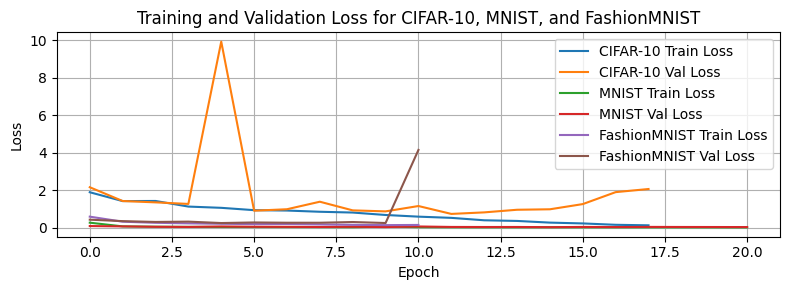

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3))

pl1 = plt.plot(cifar_train_loss_history, label='CIFAR-10 Train Loss')
pl2 = plt.plot(cifar_val_loss_history, label='CIFAR-10 Val Loss')
pl3 = plt.plot(mnist_train_loss, label='MNIST Train Loss')
pl4 = plt.plot(mnist_val_loss, label='MNIST Val Loss')
pl5 = plt.plot(fashion_train_loss, label='FashionMNIST Train Loss')
pl6 = plt.plot(fashion_val_loss, label='FashionMNIST Val Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss for CIFAR-10, MNIST, and FashionMNIST')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

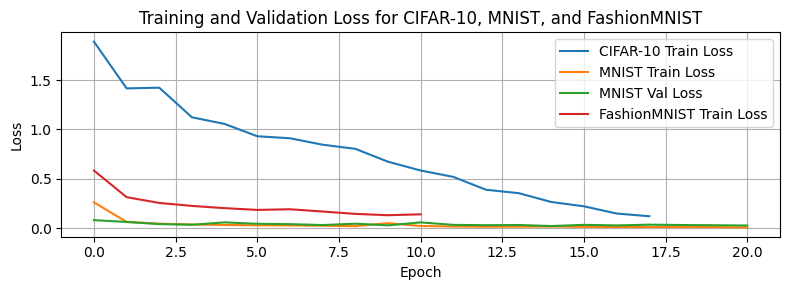

In [ ]:
plt.figure(figsize=(8, 3))

pl1 = plt.plot(cifar_train_loss_history, label='CIFAR-10 Train Loss')
pl3 = plt.plot(mnist_train_loss, label='MNIST Train Loss')
pl4 = plt.plot(mnist_val_loss, label='MNIST Val Loss')
pl5 = plt.plot(fashion_train_loss, label='FashionMNIST Train Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss for CIFAR-10, MNIST, and FashionMNIST')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Lab 2

In this exercise, we will just use a pre-trained YOLOv8

In [ ]:
assert RUN_FLAG, "Lock triggered" # This is just to avoid running on accident

## Ultralytics installation

We use YOLOv8 developed by Ultralytics. Source code: https://github.com/ultralytics/ultralytics

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

## Code

We implement a detect function taking in a model, input and output paths, for the use of multiple models. The models used are size variants of YOLOv8 from smallest to biggest in terms of parameters (n, m, s, l, x).

The video is passed frame-by-frame, since YOLOv8 does not allow passing in the form of a batch of images (4D tensor) in deployment.

In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO

def detect(model, in_file_name, out_file_name):
  vid_cap = cv2.VideoCapture(in_file_name)
  out_cap = cv2.VideoWriter(out_file_name, cv2.VideoWriter_fourcc(*'mp4v'),\
      vid_cap.get(cv2.CAP_PROP_FPS), \
      (int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))

  while vid_cap.isOpened():
    # each video is passed frame-by-frame
    ret, frame = vid_cap.read()
    if not ret:
      break

    results = model(frame, device=device, verbose=False)

    # plot bbox and write video output
    annotated_frame = results[0].plot()
    out_cap.write(annotated_frame)

  vid_cap.release()
  out_cap.release()

  return detection_list

Code execution to output in a Google Drive folder.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
folder_path = '/content/drive/MyDrive/YOLOv8/'
file_type = '.mp4'
file_name = 'video'
input_path = folder_path + file_name + file_type
models = [
    YOLO("yolov8n.pt"),
    YOLO("yolov8s.pt"),
    YOLO("yolov8m.pt"),
    YOLO("yolov8l.pt"),
    YOLO("yolov8x.pt"),
]
output_filenames = [
    file_name + "_yolov8n" + file_type,
    file_name + "_yolov8s" + file_type,
    file_name + "_yolov8m" + file_type,
    file_name + "_yolov8l" + file_type,
    file_name + "_yolov8x" + file_type,
]
for i in range(5):
  detect(models[i], input_path, folder_path + output_filenames[i])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Results

### Repository

Result folder is stored at [this Google Drive link](https://drive.google.com/drive/folders/1bR0x46R4Ewb1rfDuaexi9ewirKAVUlms?usp=sharing).


### Evaluation

We inspect the output videos by plain observation, not through any accuracy evaluation metrics in order to keep this close to practical usage of the model.

In execution, each video is passed frame-by-frame through a model to get bounding box predictions plotted. The output video is written in the same format, frame-per-second rate, and resolution.

**INPUT**

It consists of 6 videos, input video *video.mp4* which is [the official music video of the song Never Gonna Give You Up by Rick Astley](https://www.youtube.com/watch?v=dQw4w9WgXcQ) using [Yt1s](https://yt1s.com.co/en99/) at auto quality, and output videos each named correspondingly to the YOLOv8 version used.

*This is only for non-revenue academic purposes. We did NOT ask for Rick Astley, nor the rightful owners of the music video, for use permission. All credits to the rightful owners.*

The input video uses 28.9 MB of storage, with resolution 1280 x 720 with duration of 3m33s. The video itself is considered to be a simple and easy object detection challenge, due to that there are very few objects at a time in most frames, and objects are mostly far away.

In this input, we observe some main challenges:
1. 1 object on the screen.
2. Multiple distant objects.
3. Multiple stacked objects.

**RUN TIME**

The execution started on August 8th at 19:17, 5 outputs come out at respectively 19:21, 19:23, 19:25, 19:29, 19:33.

##### Challenge 1: 1 object on the screen.

The simplest task of it all, and there is no surprise the smallest model (YOLOv8n) is able to consistently maintain objectness score above 0.8 when there is only one person on the quite plain screen.

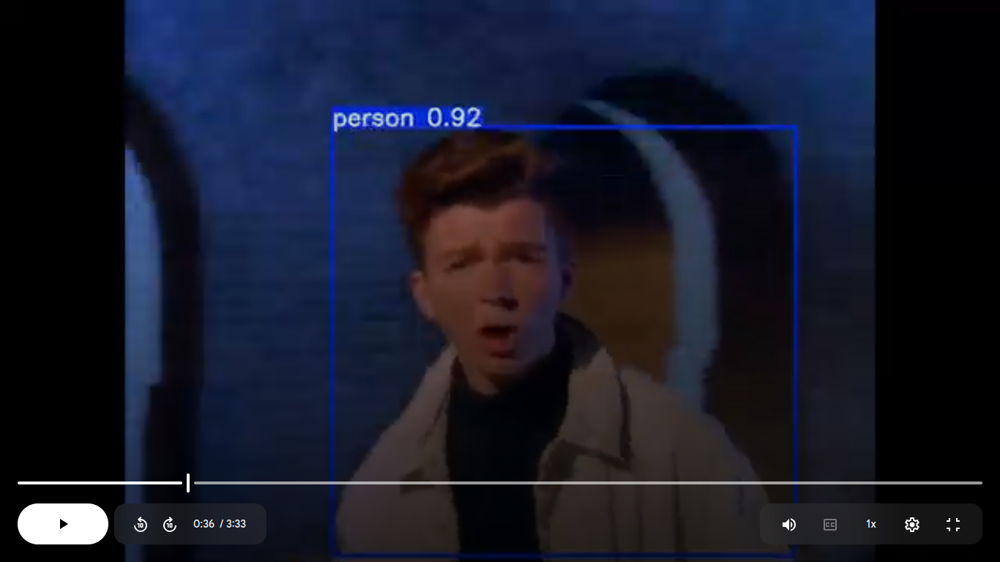

However, the common issue with CNN is how convolution heavily relies on an object's size in respect to the resolution, hence the objectness score immediately drops as the person is far away from the camera. This is for YOLOv8n:

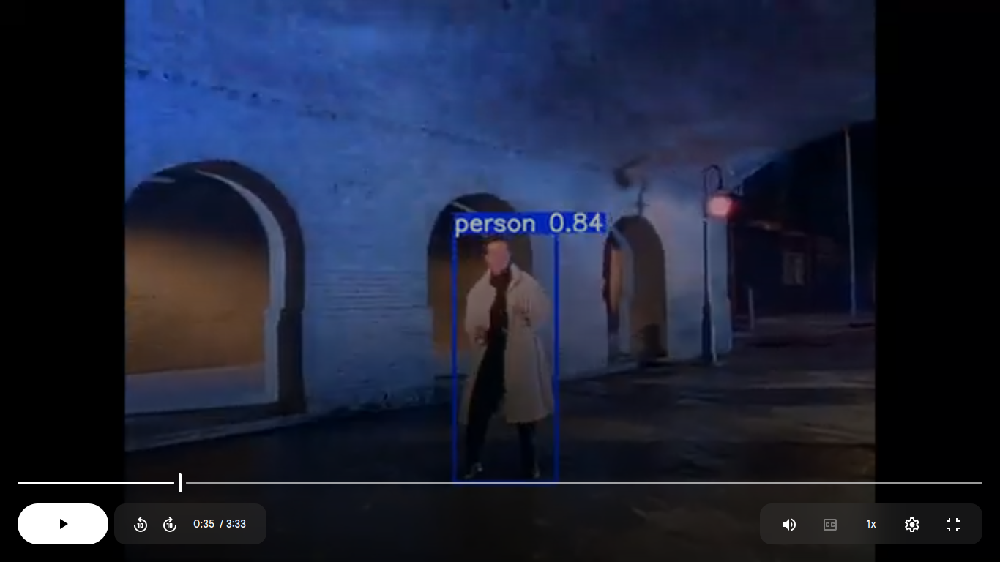

Increasing the number of parameters helps a lot with detecting smaller objects, as the objectness score is increased in YOLOv8x (\~0.90) in comparison to YOLOv8n (\~0.85).

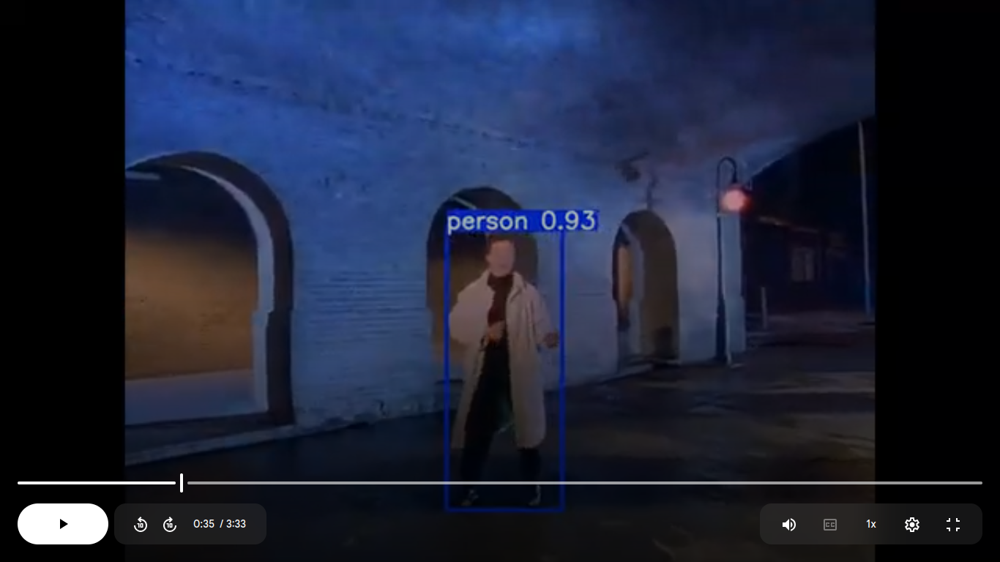

##### Challenge 2. Multiple distant objects

The common instance for this in the video is when multiple dancers are on a stage, in a closer recording view so that not so many other objects (chairs and tables) are in sight nor stacked on top of each other. This is for YOLOv8n, which we can see that the objectness scores remain high for 3 people on the stage.

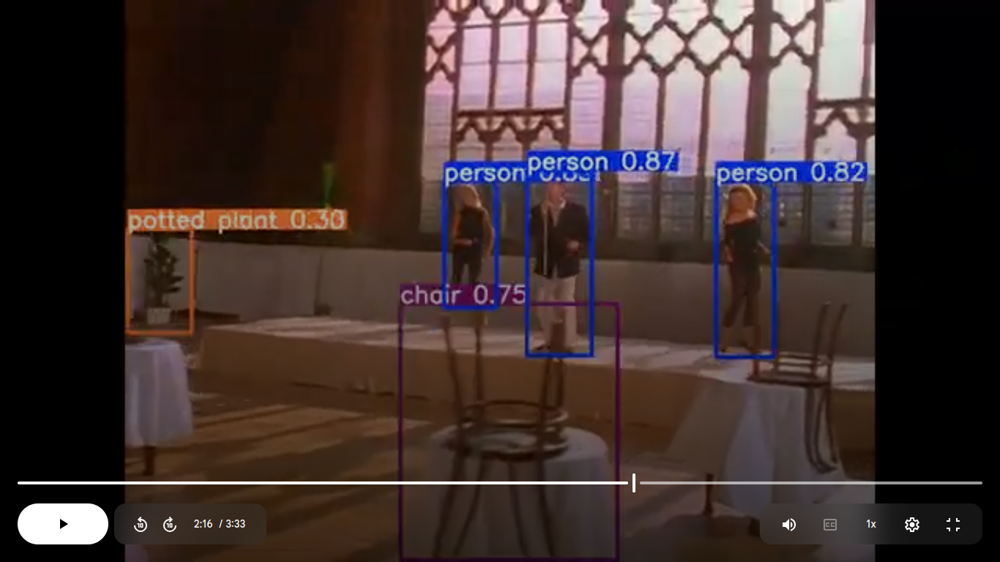

Here in YOLOv8l (2nd most parameters), the scores for 3 people are still higher.

But interestingly, while YOLOv8n gets more false negatives as it does not detect some surrounding objects, YOLOv8l gets more false positives. In the context of object detection, false positive is a lot better than false negative.

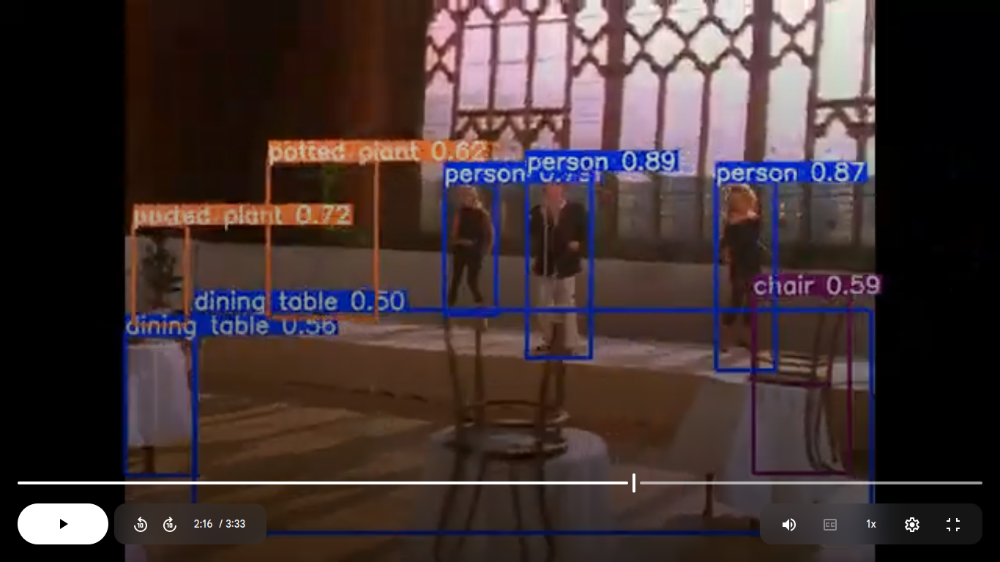

##### Challenge 3. Multiple stacked objects

After observations, we have 2 scenes to talk about the model versions' strengths and weaknesses.

###### Scene 1

Another scene we would like to talk about is at 0:52, the bartender with multiple groups of glasses behind him and on the table in the down right corner. This is what YOLOv8n gets us.

Even when the multiple objects are not stacked, YOLOv8n gets a lot of struggles being able to detect them, and at a very low objectness score.

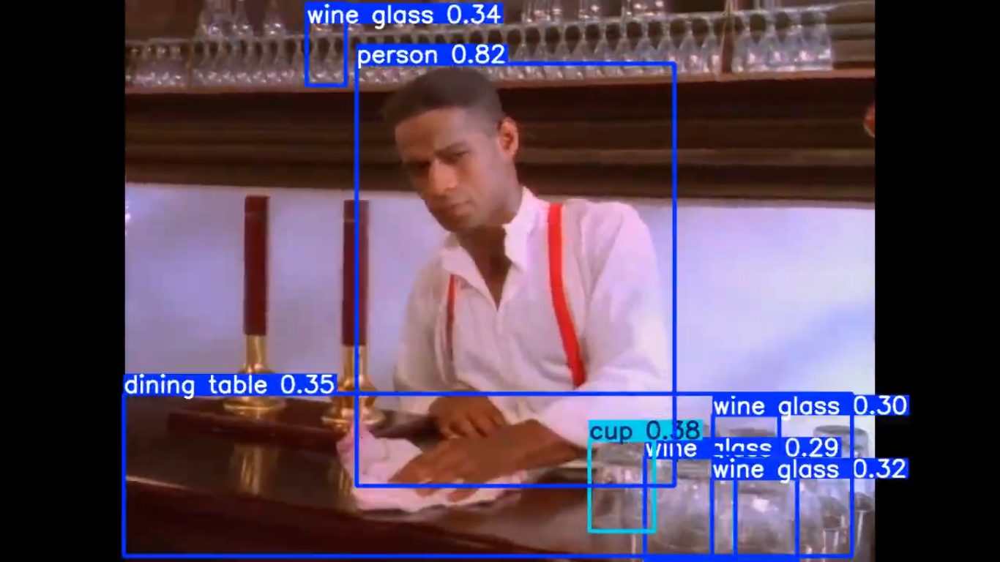

Interestingly enough, YOLOv8s (2nd lowest number of parameters) performs a lot worse, being pretty much unable to separate the group of glasses in the down right corner.

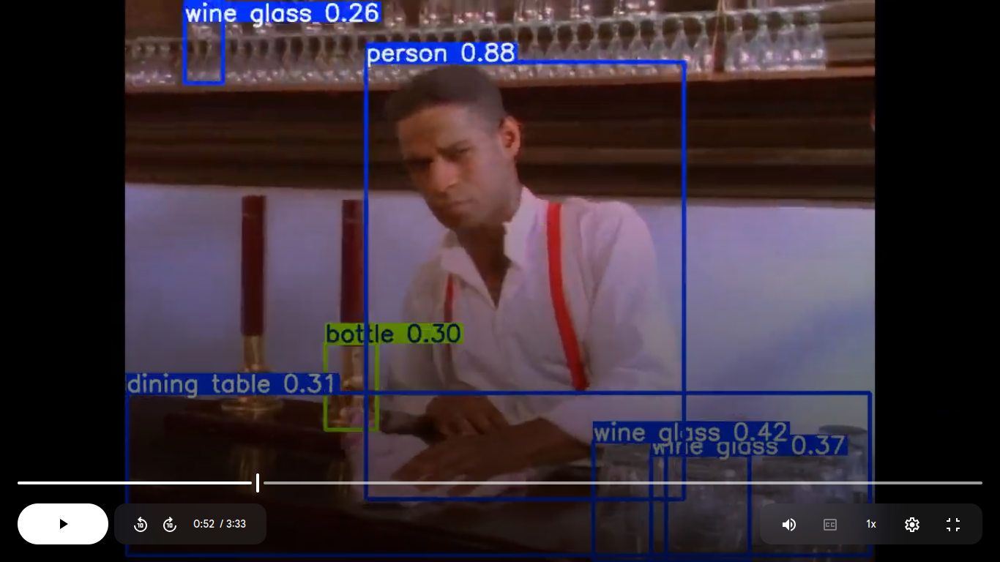

YOLOv8l below improves the results a lot from both YOLOv8n and YOLOv8s, suggesting the double descent phenomenon.

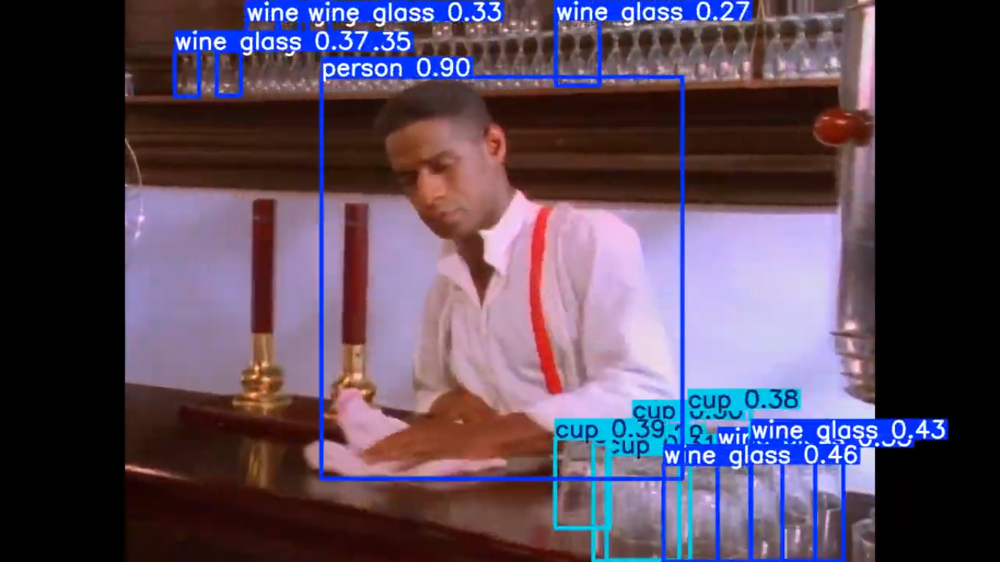

We get to YOLOv8x, the objectness scores are increased, but we could tell that the model would have been able to detect the glasses on the back if we lower the threshold, since this model version is able to detect some "bottles" (2nd line of glasses) at the very top, or it just needs some more tuning if we intend to focus on detecting and classifying a smaller group of classes.

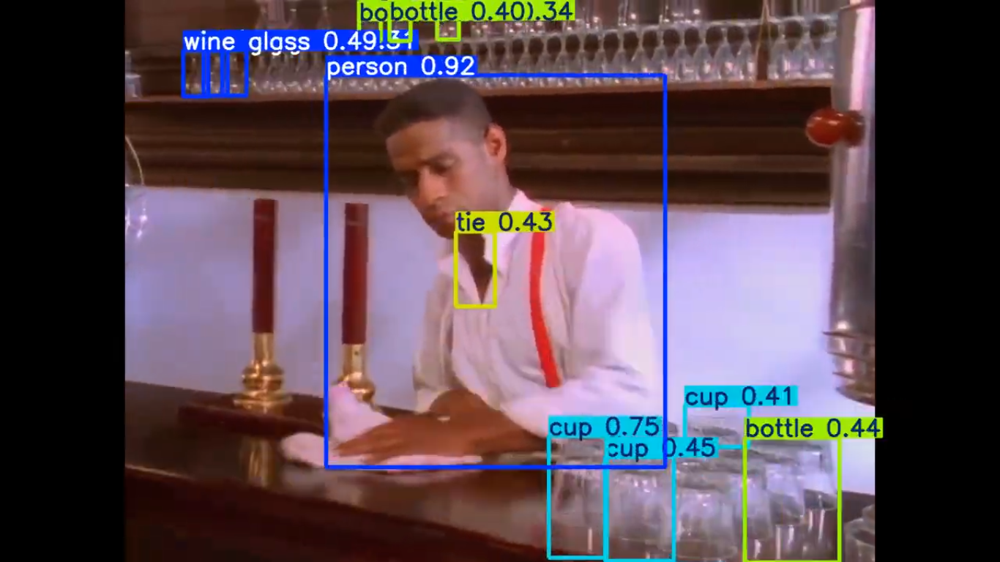

While the down right corner of glasses is hard to detect due to that glasses are transparent meaning color blending, but since edge detection feature extraction might probably overcome this issue, it seems that YOLOv8 does not have the technique implemented.

###### Scene 2

This scene is at 0:42, which is another perspective of the stage of 3 people. This scene is specifically chosen due to the stacks of tables and chairs, both of which are specified classes in COCO dataset that YOLOv8 is pre-trained on. Items in this scene are only stacked, not really as small as glasses in scene 1.

Firstly, YOLOv8n gives us this prediction, which is pretty bad if we focus on stacks of chairs and tables: 2/10 chairs and 0/7 tables detected, and with semi-low objectness scores on the 2 detected chairs.

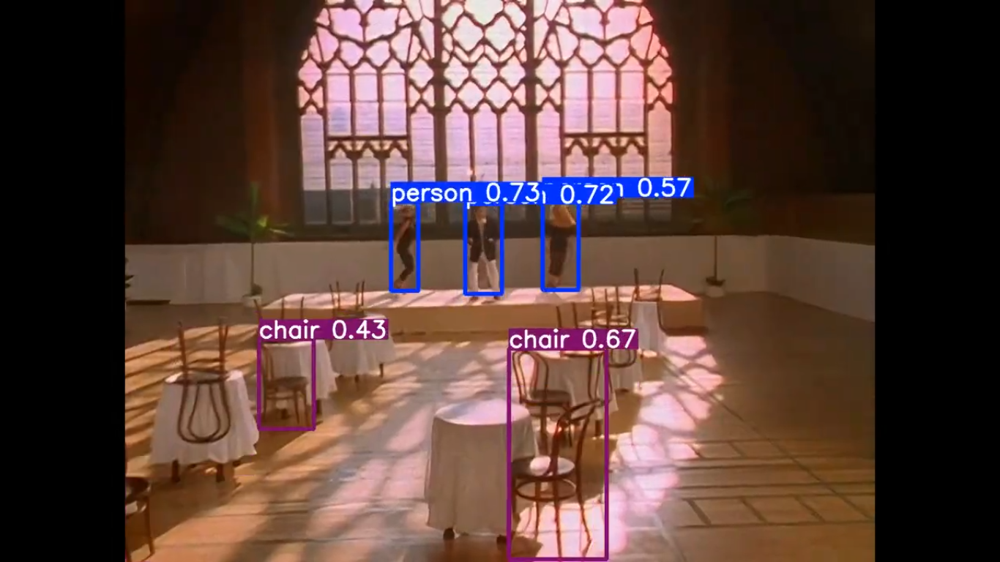

Compared to YOLOv8n, YOLOv8m (3rd most parameters) takes this up a notch, though still skips through some of the harder objects, especially the tables and chairs on the right side.

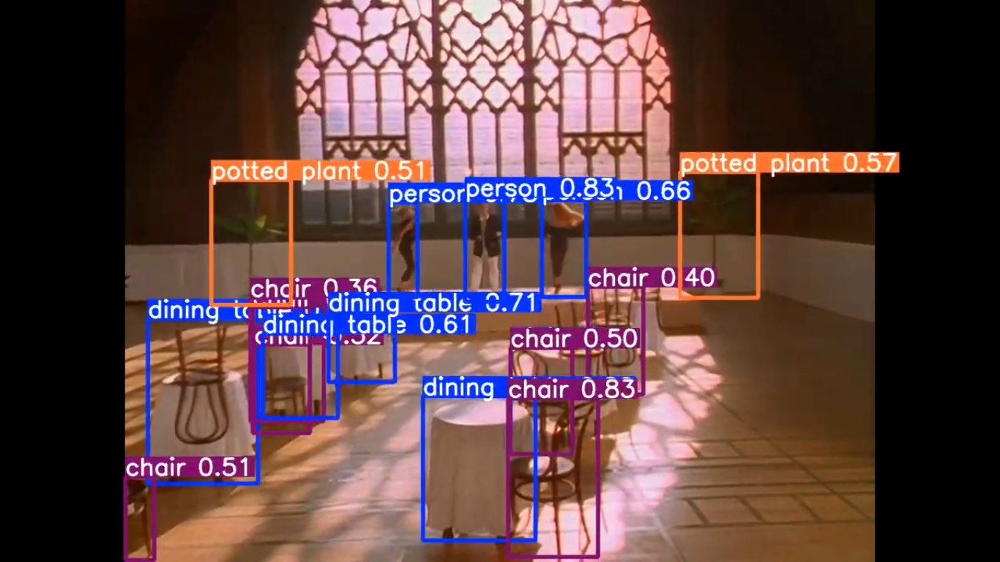

And of course, here comes YOLOv8x with the best objectness scores as well, though the main issue is that objectness scores start to decrease on some easier objects (like middle person), suggesting overfitting.

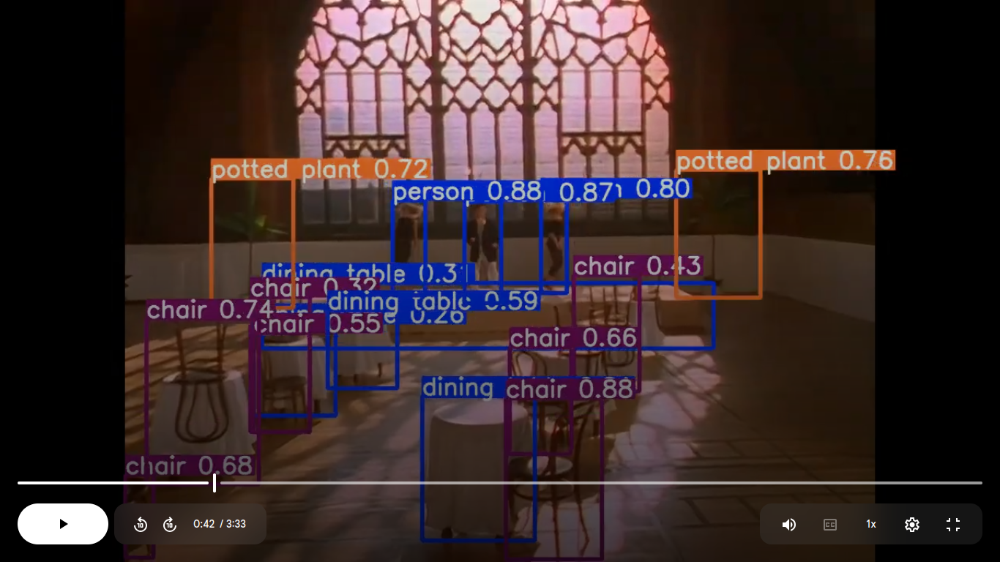

### Conclusion

YOLOv8 pretty much demonstrates common issues that CNNs tend to have:
1. Heavy reliance on object-to-resolution ratio: while YOLOv8 (especially with higher number of parameters) is able to detect smaller objects, it is completely inconsistent, especially with the barista and glasses scene. Higher number of parameters improves this, but the increase is almost insignificant between YOLOv8m and YOLOv8x.
2. Double descent phenomenon and underfitting: YOLOv8n & YOLOv8s are impractical in detecting some smaller objects, and/or stacked objects, they need a lot more parameters.
3. Poor contextual object detection and classification: some boxes show up for only one frame then disappear, so if the images are linked to close frames like how LSTM models do, we could easily eliminate some false positives.

Those are the reasons that I think is why CNNs like YOLO is best used for object detection instead of classification. Reasons #2 and #3 are why object classification are better left for LSTM and models that could apply image processing techniques to extract features, rather than trying to simply fitting with more parameters, especially for smaller and more stacked objects.

# Lab 3

In this exercise, we would simply do the requirements, since that alone is actually quite hard.

Result of this exercise is stored here: https://drive.google.com/drive/folders/1E_HvR5k1FTZzUEgP3Jy3J4Is1f7PJMRK?usp=sharing

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import os
print(os.path.exists('/content/drive/MyDrive/LoRA DreamBooth/'))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
True


## DreamBooth dataset

#### Dataset

In [3]:
!git clone https://github.com/google/dreambooth.git

Cloning into 'dreambooth'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 212 (delta 5), reused 1 (delta 1), pack-reused 206 (from 1)
Receiving objects: 100% (212/212), 106.84 MiB | 14.48 MiB/s, done.
Resolving deltas: 100% (10/10), done.


In [4]:
# this is to load the dataset for training in sync with torch.dataloader
# This is based on PEFT implementation on finetuning DreamBooth dataset
# Credit (https://github.com/huggingface/peft/blob/main/examples/lora_dreambooth/train_dreambooth.py, line 460)
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

import random
import os

class DreamBoothDataset(Dataset):
  def __init__(self, tokenizer=None, image_size=416):
    self.tokenizer = None
    self.unique_token_list = []
    self.image_transform = transforms.Compose([
      transforms.Resize((image_size, image_size)),
      transforms.CenterCrop(image_size),
      transforms.ToTensor(),
      transforms.Normalize([0.5], [0.5])
    ])

    dir_path = '/content/dreambooth/dataset/'
    info_path = dir_path + 'prompts_and_classes.txt'

    # read classes
    self.sample_list = [] # create sample for each case of class and prompt template
    self.mapping = {}
    with open(info_path, 'r') as f:
        lines = f.readlines()
        for line in lines[3:33]:
          subject, class_token = line.split(',')
          self.mapping[subject] = class_token
          unique_token = '<' + subject + '>'

          self.unique_token_list.append(unique_token)

          prompt_list = [
            'a {0} {1} in the jungle'.format(unique_token, class_token),
            'a {0} {1} in the snow'.format(unique_token, class_token),
            'a {0} {1} on the beach'.format(unique_token, class_token),
            'a {0} {1} on a cobblestone street'.format(unique_token, class_token),
            'a {0} {1} on top of pink fabric'.format(unique_token, class_token),
            'a {0} {1} on top of a wooden floor'.format(unique_token, class_token),
            'a {0} {1} with a city in the background'.format(unique_token, class_token),
            'a {0} {1} with a mountain in the background'.format(unique_token, class_token),
            'a {0} {1} with a blue house in the background'.format(unique_token, class_token),
            'a {0} {1} on top of a purple rug in a forest'.format(unique_token, class_token),
            'a {0} {1} with a wheat field in the background'.format(unique_token, class_token),
            'a {0} {1} with a tree and autumn leaves in the background'.format(unique_token, class_token),
            'a {0} {1} with the Eiffel Tower in the background'.format(unique_token, class_token),
            'a {0} {1} floating on top of water'.format(unique_token, class_token),
            'a {0} {1} floating in an ocean of milk'.format(unique_token, class_token),
            'a {0} {1} on top of green grass with sunflowers around it'.format(unique_token, class_token),
            'a {0} {1} on top of a mirror'.format(unique_token, class_token),
            'a {0} {1} on top of the sidewalk in a crowded street'.format(unique_token, class_token),
            'a {0} {1} on top of a dirt road'.format(unique_token, class_token),
            'a {0} {1} on top of a white rug'.format(unique_token, class_token),
            'a red {0} {1}'.format(unique_token, class_token),
            'a purple {0} {1}'.format(unique_token, class_token),
            'a shiny {0} {1}'.format(unique_token, class_token),
            'a wet {0} {1}'.format(unique_token, class_token),
            'a cube shaped {0} {1}'.format(unique_token, class_token)
          ]

          # read the paths
          subject_dir = os.path.join(dir_path + subject)
          for fname in os.listdir(subject_dir):
            if fname.endswith((".jpg")):
              img_path = os.path.join(subject_dir, fname)
              self.sample_list.append((img_path, prompt_list))

  def __len__(self):
    return len(self.sample_list)

  def __getitem__(self, idx):
    imp_path, prompt_list = self.sample_list[idx]
    prompt = random.choice(prompt_list)

    img = Image.open(imp_path).convert("RGB")
    img = self.image_transform(img)

    input_id = self.tokenizer(
      prompt,
      padding="max_length",
      truncation=True,
      max_length=self.tokenizer.model_max_length,
      return_tensors="pt"
    ).input_ids[0]

    return {"pixel_values": img, "input_ids": input_id}

In [5]:
dreambooth = DreamBoothDataset()

#### Tokenizer: add tokens from the dataset

In [6]:
# build tokenizer and text encoding for new tokens from the dataset
from transformers import CLIPTokenizer, CLIPTextModel
import torch

model = "runwayml/stable-diffusion-v1-5"
tokenizer = CLIPTokenizer.from_pretrained(model, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(model, subfolder="text_encoder").to(device)

# add tokens
tokenizer.add_tokens(dreambooth.unique_token_list)
text_encoder.resize_token_embeddings(len(tokenizer))

# embedding tokens into text encoder
with torch.no_grad():
  token_embed = text_encoder.get_input_embeddings().weight
  for subj, token in zip(dreambooth.mapping.keys(), dreambooth.unique_token_list):
    new_id = tokenizer.convert_tokens_to_ids(token)
    cls = dreambooth.mapping[subj]
    cls_ids = tokenizer(cls, add_special_tokens=False).input_ids
    if len(cls_ids) == 0:
      token_embed[new_id].normal_(mean=0.0, std=token_embed.std().item())
    else:
      cls_emb = token_embed[cls_ids].mean(dim=0)
      token_embed[new_id].copy_(cls_emb)

# set tokenizer
dreambooth.tokenizer = tokenizer

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


#### Split dataset

In [7]:
def split_dataset(dataset):
  # hardcoded: [0.8, 0.2]
  # all are the same, except the sample list is split
  import copy
  d_train, d_test = DreamBoothDataset(), DreamBoothDataset()
  d_train.tokenizer = copy.deepcopy(dataset.tokenizer)
  d_test.tokenizer = copy.deepcopy(dataset.tokenizer)

  d_train.mapping = dataset.mapping.copy()
  d_test.mapping = dataset.mapping.copy()
  d_train.unique_token_list = dataset.unique_token_list.copy()
  d_test.unique_token_list = dataset.unique_token_list.copy()

  d_train.image_transform = dataset.image_transform
  d_test.image_transform = dataset.image_transform

  import random
  random.shuffle(dataset.sample_list)
  d_train.sample_list = dataset.sample_list[:int(len(dataset.sample_list) * 0.8)]
  d_test.sample_list = dataset.sample_list[int(len(dataset.sample_list) * 0.8):]

  return d_train, d_test
train, test = split_dataset(dreambooth)

## Stable Diffusion (v1.5)

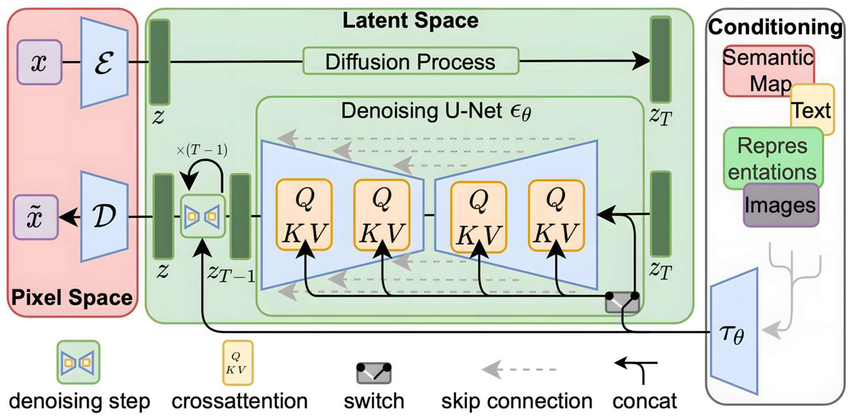

We use Diffusers library that internally supports diffusion model components, combined with PEFT library that supports LoRA fine-tuning and Diffusers.

### VAE and UNet setup

In [8]:
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
import torch
from peft import LoraConfig, TaskType, get_peft_model

model = "runwayml/stable-diffusion-v1-5"
vae = AutoencoderKL.from_pretrained(model, subfolder="vae").to(device)
vae.enable_gradient_checkpointing()
unet = UNet2DConditionModel.from_pretrained(model, subfolder="unet").to(device)
unet.enable_gradient_checkpointing()
noise_scheduler = DDPMScheduler.from_pretrained(model, subfolder="scheduler")

# this configuration is blatantly stolen from PEFT official documentation
# https://huggingface.co/docs/peft/en/tutorial/peft_model_config
lora_config = LoraConfig(
    r=16,
    target_modules=["to_q", "to_v"],
    lora_alpha=32,
    lora_dropout=0.05
)

# apply lora configuration
unet = get_peft_model(unet, lora_config)

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

## Train

In [ ]:
assert RUN_FLAG, "" # comment this line to run
from torch.utils.data import DataLoader
import gc
train_dataloader = DataLoader(train, batch_size=4, shuffle=True)
test_dataloader = DataLoader(test, batch_size=4, shuffle=True)

optimizer_unet = torch.optim.AdamW(unet.parameters(), lr=1e-5)
optimizer_vae = torch.optim.AdamW(vae.parameters(), lr=1e-5)

In [ ]:
patience = 5
import numpy as np
min_test_loss = np.inf
for epoch in range(50):
  train_loss = 0
  test_loss = 0

  # train
  unet.train()
  vae.train()
  for step, batch in enumerate(train_dataloader):
    pixel_values = batch["pixel_values"].to(device)
    input_ids = batch["input_ids"].to(device)

    # encode image to latents
    latents = vae.encode(pixel_values).latent_dist.sample()

    # encode text to embeddings
    # note: text encoder is swapped back and forth since Google Colab T4 GPU does not have sufficient memory.
    encoder_hidden_states = text_encoder(input_ids)[0]

    # generate noise
    noise = torch.randn_like(latents)
    timesteps = torch.randint(
      0, noise_scheduler.num_train_timesteps,
      (latents.shape[0],), device=latents.device
    ).long()

    # apply noise to train
    noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

    # prediction
    pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

    # loss & update
    train_loss = torch.nn.functional.mse_loss(pred, noise)
    train_loss.backward()
    optimizer_unet.step()
    optimizer_vae.step()
    optimizer_unet.zero_grad()
    optimizer_vae.zero_grad()

  # eval
  unet.eval()
  vae.eval()
  for step, batch in enumerate(train_dataloader):
    pixel_values = batch["pixel_values"].to(device)
    input_ids = batch["input_ids"].to(device)

    with torch.no_grad():
      # encode image to latents
      latents = vae.encode(pixel_values).latent_dist.sample()

      # encode text to embeddings
      encoder_hidden_states = text_encoder(input_ids)[0]

      # generate noise
      noise = torch.randn_like(latents)
      timesteps = torch.randint(
        0, noise_scheduler.num_train_timesteps,
        (latents.shape[0],), device=latents.device
      ).long()

      # apply noise to train
      noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

      # prediction
      pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

      # loss & update
      test_loss = torch.nn.functional.mse_loss(pred, noise)

  print(f"Epoch {epoch}, train loss: {train_loss:.4f}, test loss: {test_loss:.4f}")
  if test_loss < min_test_loss:
    min_test_loss = test_loss
    patience = 5
    torch.save(unet.state_dict(), "/content/drive/MyDrive/LoRA DreamBooth/unet.pt")
    torch.save(vae.state_dict(), "/content/drive/MyDrive/LoRA DreamBooth/vae.pt")
  else:
    patience -= 1
    if patience == 0:
      print(f"Early stopped.")
      break

/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `num_train_timesteps` directly via 'DDPMScheduler' object attribute is deprecated. Please access 'num_train_timesteps' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.num_train_timesteps'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


Epoch 0, train loss: 1.4015, test loss: 0.9068
Epoch 1, train loss: 0.6596, test loss: 0.3044
Epoch 2, train loss: 0.0644, test loss: 0.1133
Epoch 3, train loss: 0.0359, test loss: 0.1556
Epoch 4, train loss: 0.0069, test loss: 0.0541
Epoch 5, train loss: 0.0127, test loss: 0.0074
Epoch 6, train loss: 0.0129, test loss: 0.0234
Epoch 7, train loss: 0.0259, test loss: 0.0646
Epoch 8, train loss: 0.0242, test loss: 0.0047
Epoch 9, train loss: 0.0131, test loss: 0.0017
Epoch 10, train loss: 0.1278, test loss: 0.0364
Epoch 11, train loss: 0.0254, test loss: 0.0052
Epoch 12, train loss: 0.0217, test loss: 0.0120
Epoch 13, train loss: 0.0104, test loss: 0.0097
Epoch 14, train loss: 0.0024, test loss: 0.0019
Early stopped.


## Deploy

In [9]:
# load base model again
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
import torch
from peft import LoraConfig, TaskType, get_peft_model

# model_id = "runwayml/stable-diffusion-v1-5"

# load stuff
# vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae").to(device)
# unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet").to(device)
# noise_scheduler = DDPMScheduler.from_pretrained(model_id, subfolder="scheduler")

# add tokens
# dreambooth = DreamBoothDataset()
# tokenizer.add_tokens(dreambooth.unique_token_list)
# text_encoder.resize_token_embeddings(len(tokenizer))

# # embedding tokens into text encoder
# with torch.no_grad():
#   token_embed = text_encoder.get_input_embeddings().weight
#   for subj, token in zip(dreambooth.mapping.keys(), dreambooth.unique_token_list):
#     new_id = tokenizer.convert_tokens_to_ids(token)
#     cls = dreambooth.mapping[subj]
#     cls_ids = tokenizer(cls, add_special_tokens=False).input_ids
#     if len(cls_ids) == 0:
#       token_embed[new_id].normal_(mean=0.0, std=token_embed.std().item())
#     else:
#       cls_emb = token_embed[cls_ids].mean(dim=0)
#       token_embed[new_id].copy_(cls_emb)

unet_path = "/content/drive/MyDrive/LoRA DreamBooth/unet.pt"
vae_path = "/content/drive/MyDrive/LoRA DreamBooth/vae.pt"

unet.load_state_dict(torch.load(unet_path), strict=False)
vae.load_state_dict(torch.load(vae_path), strict=False)

lora_config = LoraConfig(
    r=16,
    target_modules=["to_q", "to_v"],
    lora_alpha=32,
    lora_dropout=0.05
)

# apply lora configuration
unet = get_peft_model(unet, lora_config)

/usr/local/lib/python3.11/dist-packages/peft/mapping_func.py:73: UserWarning: You are trying to modify a model with PEFT for a second time. If you want to reload the model with a different config, make sure to call `.unload()` before.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/peft/tuners/tuners_utils.py:196: UserWarning: Already found a `peft_config` attribute in the model. This will lead to having multiple adapters in the model. Make sure to know what you are doing!
  warnings.warn(


In [31]:
import numpy as np
prompt = "A vase in the ocean"
unet.eval()
vae.eval()
text_encoder.eval()

# input token
inputs = tokenizer(prompt, return_tensors="pt").to(device)
with torch.no_grad():
  encoder_hidden_states = text_encoder(inputs.input_ids)[0]

latent_shape = (1, vae.config.latent_channels, 64, 64)

# add noise to latent
latents = torch.randn(latent_shape, device=device)
for t in reversed(range(noise_scheduler.num_train_timesteps)):
  timestep = torch.tensor([t], device=device)
  with torch.no_grad():
    noise_pred = unet(latents, timestep, encoder_hidden_states).sample
  latents = noise_scheduler.step(noise_pred, t, latents).prev_sample

# decode
image = None
with torch.no_grad():
  image = vae.decode(latents).sample
print(image.shape)

/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `num_train_timesteps` directly via 'DDPMScheduler' object attribute is deprecated. Please access 'num_train_timesteps' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.num_train_timesteps'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


torch.Size([1, 3, 512, 512])


In [ ]:
# normalize image and output
image = image.detach().cpu().numpy()
image = image / 2 + 0.5
image = np.transpose(image, (0, 2, 3, 1))
image = (image * 255).astype(np.uint8)

image = Image.fromarray(image[0])

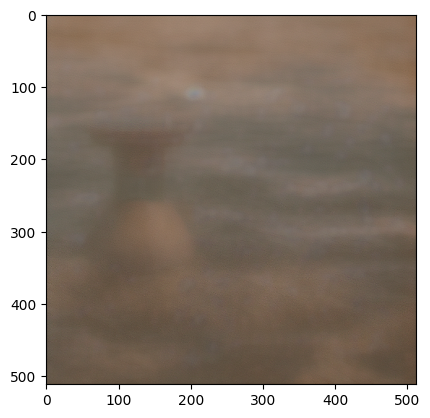

In [35]:
image.save("/content/drive/MyDrive/LoRA DreamBooth/A vase in the ocean.png")

import matplotlib.pyplot as plt
plt.imshow(image)
plt.show()